# **YOLOv9:**

In [1]:
!nvidia-smi

Sun Apr  7 11:42:14 2024       
+---------------------------------------------------------------------------------------+
| NVIDIA-SMI 535.104.05             Driver Version: 535.104.05   CUDA Version: 12.2     |
|-----------------------------------------+----------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |         Memory-Usage | GPU-Util  Compute M. |
|                                         |                      |               MIG M. |
|=========================================+======================+======================|
|   0  Tesla T4                       Off | 00000000:00:04.0 Off |                    0 |
| N/A   75C    P0              34W /  70W |      0MiB / 15360MiB |      0%      Default |
|                                         |                      |                  N/A |
+-----------------------------------------+----------------------+--

In [2]:
!pip install -U -q ultralytics supervision

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 749.5/749.5 kB 14.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 97.1/97.1 kB 13.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 23.7/23.7 MB 60.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 823.6/823.6 kB 66.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 14.1/14.1 MB 97.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 731.7/731.7 MB 2.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 410.6/410.6 MB 3.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 121.6/121.6 MB 14.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.5/56.5 MB 30.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 124.2/124.2 MB 6.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 196.0/196.0 MB 4.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 166.0/166.0 MB 6.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━

In [3]:
from google.colab import drive
drive.mount("/content/drive")

Mounted at /content/drive


In [4]:
!unzip -q drive/MyDrive/DP/VEGA/data/YOLO/digits_original_crops.zip
!unzip -q drive/MyDrive/DP/VEGA/data/YOLO/glyphs_original_crops.zip

In [3]:
from ultralytics import YOLO
from supervision import Detections, DetectionDataset, InferenceSlicer, BoxAnnotator, MaskAnnotator, plot_image
from supervision.draw.color import Color, ColorPalette
from PIL import Image
import numpy as np
import cv2
!yolo checks

Ultralytics YOLOv8.1.44 🚀 Python-3.10.12 torch-2.2.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
Setup complete ✅ (8 CPUs, 51.0 GB RAM, 30.5/201.2 GB disk)

OS                  Linux-6.1.58+-x86_64-with-glibc2.35
Environment         Colab
Python              3.10.12
Install             pip
RAM                 50.99 GB
CPU                 Intel Xeon 2.00GHz
CUDA                12.1

matplotlib          ✅ 3.7.1>=3.3.0
opencv-python       ✅ 4.8.0.76>=4.6.0
pillow              ✅ 9.4.0>=7.1.2
pyyaml              ✅ 6.0.1>=5.3.1
requests            ✅ 2.31.0>=2.23.0
scipy               ✅ 1.11.4>=1.4.1
torch               ✅ 2.2.1+cu121>=1.8.0
torchvision         ✅ 0.17.1+cu121>=0.9.0
tqdm                ✅ 4.66.2>=4.64.0
psutil              ✅ 5.9.5
py-cpuinfo          ✅ 9.0.0
thop                ✅ 0.1.1-2209072238>=0.1.1
pandas              ✅ 2.0.3>=1.1.4
seaborn             ✅ 0.13.1>=0.11.0


## Digits:

In [4]:
digits_model = YOLO("/content/drive/MyDrive/DP/VEGA/weights/yolo_v9_digits_best.pt")

In [8]:
digits_model_test_metrics = digits_model.val(data="/content/digits_original_crops/data.yaml", split="test")

Ultralytics YOLOv8.1.44 🚀 Python-3.10.12 torch-2.2.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
YOLOv9c-seg summary (fused): 411 layers, 27632238 parameters, 0 gradients, 157.7 GFLOPs


100%|██████████| 755k/755k [00:00<00:00, 129MB/s]
val: Scanning /content/digits_original_crops/test/labels... 451 images, 0 backgrounds, 0 corrupt: 100%|██████████| 451/451 [00:00<00:00, 829.25it/s]

val: New cache created: /content/digits_original_crops/test/labels.cache



                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 29/29 [00:29<00:00,  1.02s/it]


                   all        451       6188      0.975      0.987      0.988      0.819      0.975      0.987      0.988      0.756
                     0        451        571      0.981      0.989      0.989      0.815      0.981      0.989      0.989      0.773
                     1        451       1111      0.977       0.99      0.985      0.823      0.977       0.99      0.985      0.717
                     2        451        629      0.973      0.982      0.986      0.795      0.973      0.982      0.986      0.758
                     3        451       1120       0.98      0.991      0.988      0.824       0.98      0.991      0.988      0.797
                     4        451        531      0.981      0.977      0.992       0.82      0.981      0.977      0.992      0.766
                     5        451        433      0.959      0.995      0.988      0.827      0.959      0.995      0.988      0.764
                     6        451        475      0.977      0.985   


0: 640x640 6 0s, 8 1s, 3 2s, 6 3s, 3 4s, 1 5, 3 7s, 1 8, 1 9, 63.0ms
Speed: 1.6ms preprocess, 63.0ms inference, 11.3ms postprocess per image at shape (1, 3, 640, 640)


SupervisionWarnings: BoxAnnotator is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


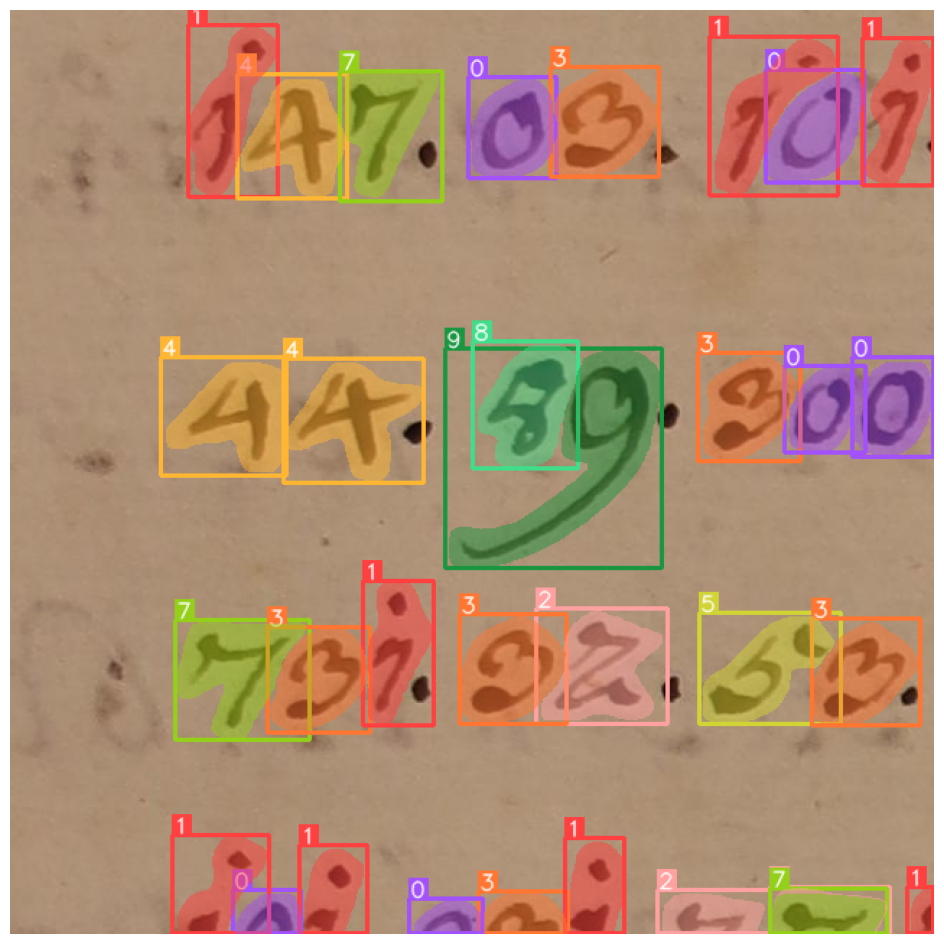

In [9]:
digits_detections = Detections.from_ultralytics(
    digits_model.predict(
        source=cv2.imread("/content/digits_original_crops/test/images/IMG_1396_col320_row2240_jpg.rf.544b449487d06932a6292e1ef744ab20.jpg")
    )[0]
)

digits_annotated_array = BoxAnnotator(
    text_color=Color.WHITE,
    thickness=2,
    text_scale=0.5,
    text_thickness=1,
    text_padding=1
).annotate(
    scene=cv2.imread("/content/digits_original_crops/test/images/IMG_1396_col320_row2240_jpg.rf.544b449487d06932a6292e1ef744ab20.jpg"),
    detections=digits_detections
)
digits_annotated_array = MaskAnnotator().annotate(
    scene=digits_annotated_array,
    detections=digits_detections
)
plot_image(digits_annotated_array)


0: 3200x2144 35 0s, 3 1s, 9 2s, 55 3s, 43 4s, 21 5s, 50 6s, 2 7s, 55 8s, 27 9s, 677.2ms
Speed: 42.2ms preprocess, 677.2ms inference, 220.4ms postprocess per image at shape (1, 3, 3200, 2144)


SupervisionWarnings: BoxAnnotator is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


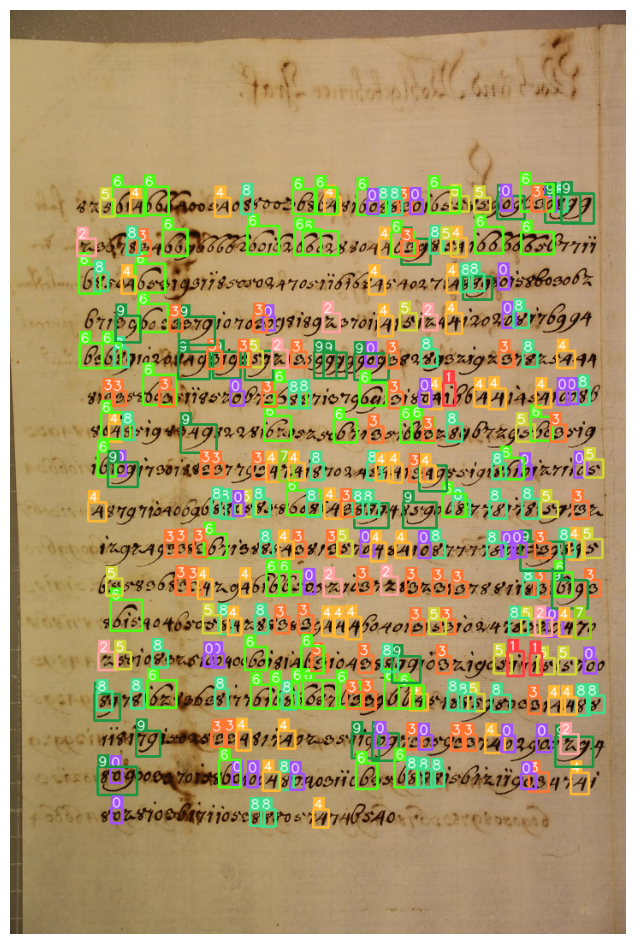

In [10]:
digits_detections = Detections.from_ultralytics(
    digits_model.predict(
        source=cv2.imread("/content/drive/MyDrive/DP/VEGA/data/BENCHMARK/digits1.jpg"),
        imgsz=3200
    )[0]
)

digits_annotated_array = BoxAnnotator(
    text_color=Color.WHITE,
    thickness=2,
    text_scale=0.5,
    text_thickness=1,
    text_padding=1
).annotate(
    scene=cv2.imread("/content/drive/MyDrive/DP/VEGA/data/BENCHMARK/digits1.jpg"),
    detections=digits_detections
)
plot_image(digits_annotated_array)


0: 3200x2400 1 0, 3 1s, 1 2, 4 3s, 18 4s, 3 5s, 767.2ms
Speed: 54.3ms preprocess, 767.2ms inference, 15.8ms postprocess per image at shape (1, 3, 3200, 2400)


SupervisionWarnings: BoxAnnotator is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


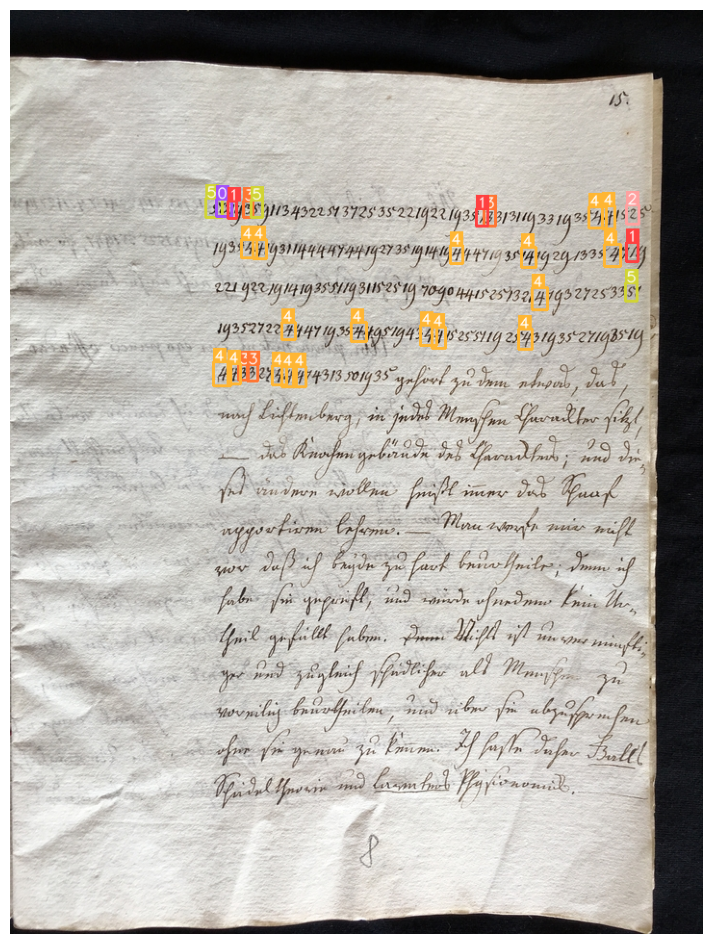

In [11]:
digits_detections = Detections.from_ultralytics(
    digits_model.predict(
        source=cv2.imread("/content/drive/MyDrive/DP/VEGA/data/BENCHMARK/letter7.jpg"),
        imgsz=3200
    )[0]
)

digits_annotated_array = BoxAnnotator(
    text_color=Color.WHITE,
    thickness=2,
    text_scale=0.5,
    text_thickness=1,
    text_padding=1
).annotate(
    scene=cv2.imread("/content/drive/MyDrive/DP/VEGA/data/BENCHMARK/letter7.jpg"),
    detections=digits_detections
)
plot_image(digits_annotated_array)

## SAHI Digits:

In [5]:
def digits_model_callback(x: np.ndarray) -> Detections:
    result = digits_model(x, verbose=False, conf=0.25)[0]
    return Detections.from_ultralytics(result)

In [6]:
digits_sahi_model = InferenceSlicer(
    callback=digits_model_callback,
    slice_wh=(160, 160),
    overlap_ratio_wh=(0.3, 0.3)
)

SupervisionWarnings: BoxAnnotator is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


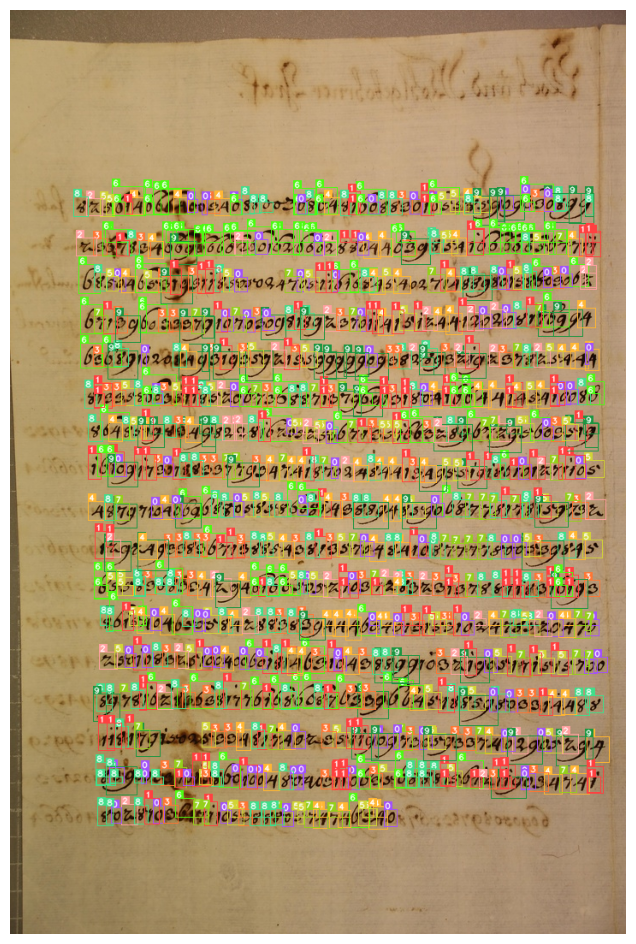

In [7]:
digits_sahi_detections = digits_sahi_model(
    image=cv2.imread("/content/drive/MyDrive/DP/VEGA/data/BENCHMARK/digits1.jpg"),
)

digits_annotated_array = BoxAnnotator(
    text_color=Color.WHITE,
    thickness=1,
    text_scale=0.3,
    text_thickness=1,
    text_padding=1
).annotate(
    scene=cv2.imread("/content/drive/MyDrive/DP/VEGA/data/BENCHMARK/digits1.jpg"),
    detections=digits_sahi_detections
)
plot_image(digits_annotated_array)

SupervisionWarnings: BoxAnnotator is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


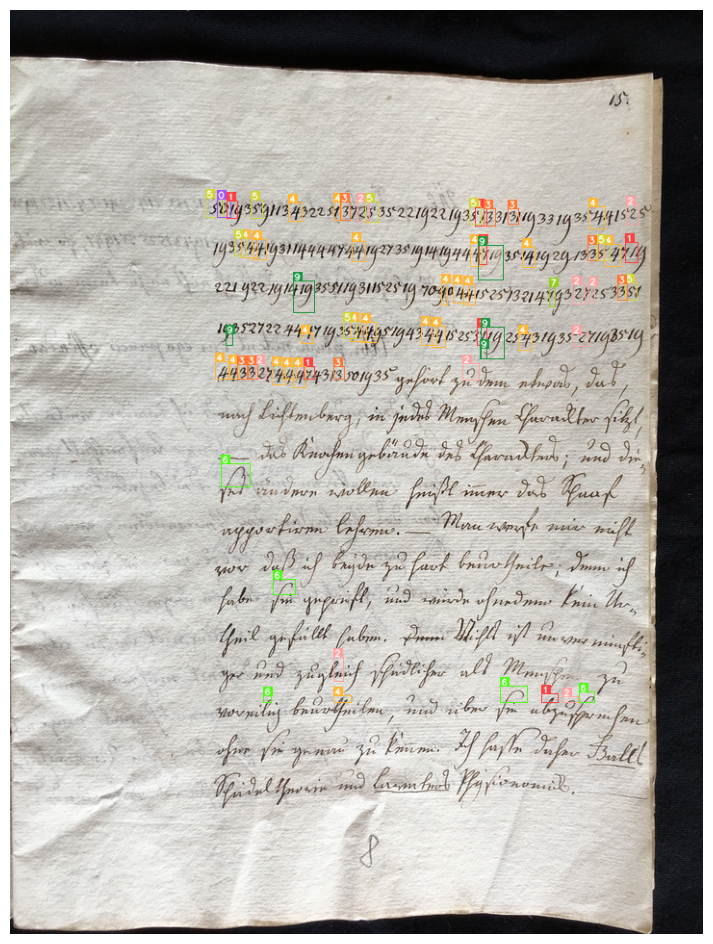

In [8]:
digits_sahi_detections = digits_sahi_model(
    image=cv2.imread("/content/drive/MyDrive/DP/VEGA/data/BENCHMARK/letter7.jpg"),
)

digits_annotated_array = BoxAnnotator(
    text_color=Color.WHITE,
    thickness=1,
    text_scale=0.3,
    text_thickness=1,
    text_padding=1
).annotate(
    scene=cv2.imread("/content/drive/MyDrive/DP/VEGA/data/BENCHMARK/letter7.jpg"),
    detections=digits_sahi_detections
)
plot_image(digits_annotated_array)

## Glyphs:

In [9]:
glyphs_model = YOLO("/content/drive/MyDrive/DP/VEGA/weights/yolo_v9_glyphs_best.pt")

SupervisionWarnings: BoxAnnotator is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


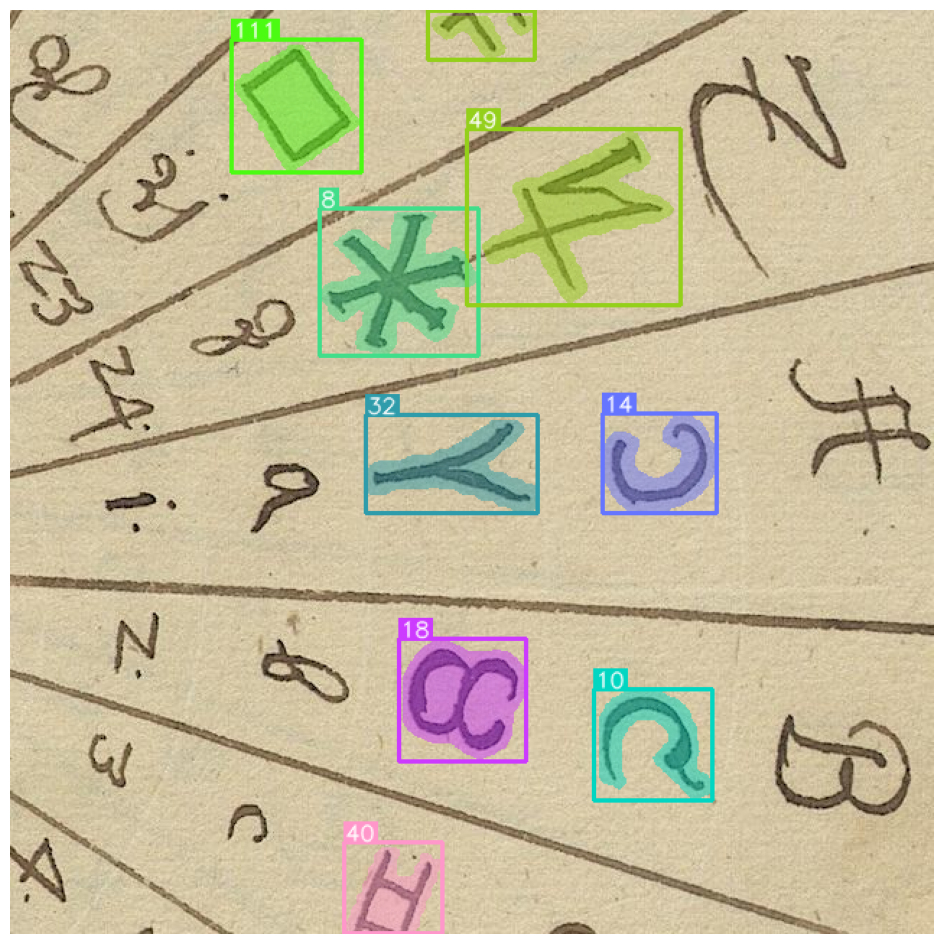

In [16]:
glyphs_detections = Detections.from_ultralytics(
    glyphs_model.predict(
        source=cv2.imread("/content/glyphs_original_crops/test/images/hhstaw_130_i_1576_0089_jpg_col1600_row1600_jpg.rf.40fc3cd09c8d0440a4cea59cad864d2f.jpg")
    )[0]
)

glyphs_annotated_array = BoxAnnotator(
    text_color=Color.WHITE,
    thickness=2,
    text_scale=0.5,
    text_thickness=1,
    text_padding=1
).annotate(
    scene=cv2.imread("/content/glyphs_original_crops/test/images/hhstaw_130_i_1576_0089_jpg_col1600_row1600_jpg.rf.40fc3cd09c8d0440a4cea59cad864d2f.jpg"),
    detections=glyphs_detections
)
glyphs_annotated_array = MaskAnnotator().annotate(
    scene=glyphs_annotated_array,
    detections=glyphs_detections
)
plot_image(glyphs_annotated_array)


0: 3200x2144 1 Z - -, 1 u0023, 1 u002a, 1 u01c2 - -, 1 u03c9, 1 u03ff, 1 u1433, 1 u1dc9, 1 u1f75e, 1 u25a1, 1 u25b3 - _, 1 u25ef, 2 u2609 D I I Is, 2 u27dc R Is, 1 u29df - I, 1 u2ad8, 723.5ms
Speed: 42.6ms preprocess, 723.5ms inference, 9.9ms postprocess per image at shape (1, 3, 3200, 2144)


SupervisionWarnings: BoxAnnotator is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


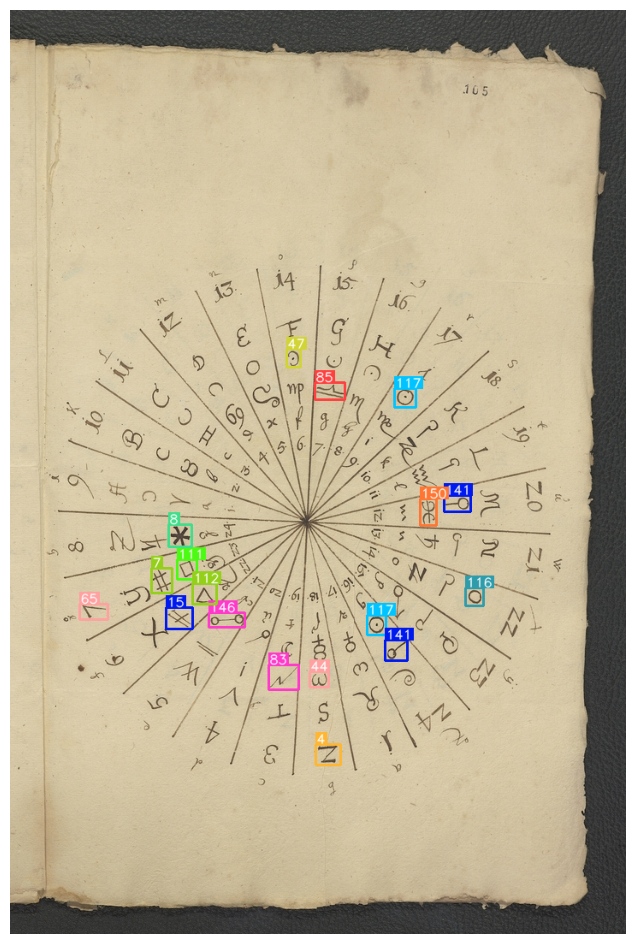

In [12]:
glyphs_detections = Detections.from_ultralytics(
    glyphs_model.predict(
        source=cv2.imread("/content/drive/MyDrive/DP/VEGA/data/BENCHMARK/glyphs1.jpg"),
        imgsz=3200
    )[0]
)

glpyhs_annotated_array = BoxAnnotator(
    text_color=Color.WHITE,
    thickness=2,
    text_scale=0.5,
    text_thickness=1,
    text_padding=1
).annotate(
    scene=cv2.imread("/content/drive/MyDrive/DP/VEGA/data/BENCHMARK/glyphs1.jpg"),
    detections=glyphs_detections
)
plot_image(glpyhs_annotated_array)

## SAHI Glyphs:

In [13]:
def glyphs_model_callback(x: np.ndarray) -> Detections:
    result = glyphs_model(x, verbose=False, conf=0.25)[0]
    return Detections.from_ultralytics(result)

In [14]:
glyphs_sahi_model = InferenceSlicer(
    callback=glyphs_model_callback,
    slice_wh=(160, 160),
    overlap_ratio_wh=(0.3, 0.3)
)

SupervisionWarnings: BoxAnnotator is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


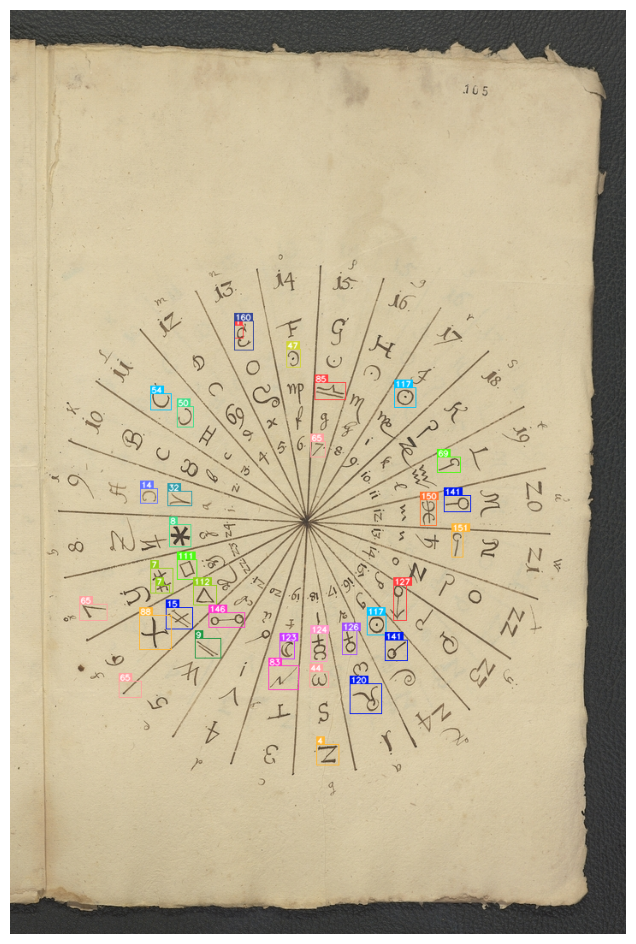

In [15]:
glyphs_sahi_detections = glyphs_sahi_model(
    image=cv2.imread("/content/drive/MyDrive/DP/VEGA/data/BENCHMARK/glyphs1.jpg"),
)

glyphs_annotated_array = BoxAnnotator(
    text_color=Color.WHITE,
    thickness=1,
    text_scale=0.3,
    text_thickness=1,
    text_padding=1
).annotate(
    scene=cv2.imread("/content/drive/MyDrive/DP/VEGA/data/BENCHMARK/glyphs1.jpg"),
    detections=glyphs_sahi_detections
)
plot_image(glyphs_annotated_array)